In [1]:
import os
import gc
import glob
import math
import random
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import utils

import albumentations as A
from albumentations.pytorch import ToTensorV2

import sys
import pickle
# sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
sys.path.append('../input/rangerdeeplearningoptimizer/ranger')
# import timm
import wandb
from ranger import Ranger

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
class Mish_layer(nn.Module):
    '''
    The class represents Mish activation function.
    '''
    def __init__(self):
        super(Mish_layer,self).__init__()
    def forward(self,x):
        return x*torch.tanh(F.softplus(x))

In [3]:
def set_seed(seed):
    #Sets the seed for Reprocudibility
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        
set_seed(7)

In [4]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb") 

wandb.login(key = wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
config = dict(
    batch_size = 256,
    epochs = 300,
    learning_rate = 2e-3
    )

In [6]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)
    data = []
    for img_path in tqdm(root_list):
        data.append(img_path)
        
    return data

In [7]:
data_root_dir = r'../input/gsocml4scimodel3/Model_III/axion/*'
dataset_img_paths_list = img_paths_list(data_root_dir)

test_data_root_dir = r'../input/gsocml4scimodel3test/Model_III_test/axion/*'
test_paths_list = img_paths_list(test_data_root_dir)

  0%|          | 0/29812 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [8]:
val_split = int(0.1 * len(dataset_img_paths_list))

random.shuffle(dataset_img_paths_list)

val_paths_list = dataset_img_paths_list[:val_split]
train_paths_list = dataset_img_paths_list[val_split:]

assert len(dataset_img_paths_list) == (len(train_paths_list) + len(val_paths_list))

len(train_paths_list), len(val_paths_list), len(test_paths_list)

(26831, 2981, 5000)

In [9]:
def pickelize_file(dicto, pickle_path):
    file_to_write = open(pickle_path, "wb")
    pickle.dump(dicto, file_to_write)
    
    print("Pickleized successfully!")
    
pickelize_file(train_paths_list, "train_paths_list.pickle")
pickelize_file(val_paths_list, "val_paths_list.pickle")

Pickleized successfully!
Pickleized successfully!


In [10]:
class CustomDataset(Dataset):
    def __init__(self, img_paths_and_labels_list,transform = None):
        self.data = img_paths_and_labels_list
        self.transform = transform
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        path = self.data[idx]
        array = np.load(path, allow_pickle = True)
        img = array[0]
        img = img.astype('float32')
        mass = torch.tensor(-(math.log10(array[1])))
       
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']      

        return img, mass

In [11]:
train_transforms = A.Compose(
            [
                A.HorizontalFlip(p = 0.5),
                A.VerticalFlip(p = 0.5),
                A.Rotate(limit = 360, p = 0.4),
                ToTensorV2()
            ]
        )


test_transforms = A.Compose(
            [
                ToTensorV2()
            ]
        )

In [12]:
train_dataset = CustomDataset(train_paths_list, transform = test_transforms)
print(len(train_dataset))

val_dataset = CustomDataset(val_paths_list, transform = test_transforms)
print(len(val_dataset))

test_dataset = CustomDataset(test_paths_list,transform = test_transforms)
print(len(test_dataset))

26831
2981
5000


In [13]:
train_loader = DataLoader(train_dataset, batch_size = config['batch_size'], shuffle = True, num_workers = 2)
val_loader = DataLoader(val_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)
test_loader = DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)

In [14]:
single_batch = next(iter(test_loader))
single_batch[0].shape

torch.Size([256, 1, 64, 64])

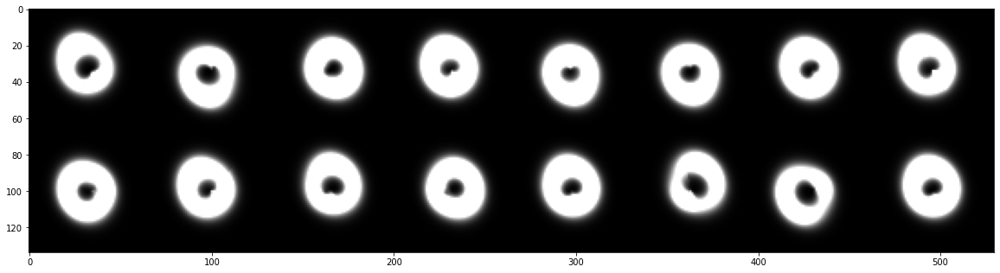

In [15]:
single_batch_grid = utils.make_grid(single_batch[0][:16], nrow=8)
plt.figure(figsize = (20,70))
plt.imshow(single_batch_grid.permute(1, 2, 0))

In [16]:
class Regressor(nn.Module):
    
    def __init__(self, in_channels = 1):
        super().__init__()
        
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 16, kernel_size = 7, stride = 2),
            nn.BatchNorm2d(16),
            Mish_layer(),

            nn.Conv2d(16, 32, 7, stride = 2),
            nn.BatchNorm2d(32),
            Mish_layer(),
            
            nn.Conv2d(32, 64, 7),
            nn.BatchNorm2d(64),
            Mish_layer(),
        )
        self.flat = nn.Flatten()
        self.fc = nn.Sequential(
                                nn.Linear(2304, 1024),
                                Mish_layer(),
                                nn.BatchNorm1d(1024),
                                nn.Dropout(p = 0.3),
                                
                                nn.Linear(1024, 512),
                                Mish_layer(),
                                nn.BatchNorm1d(512),
                                nn.Dropout(p = 0.2),
        
                                nn.Linear(512, 256),
                                Mish_layer(),
                                nn.BatchNorm1d(256),
                                
                                nn.Linear(256, 1)
                                )
        
    def forward(self, x):
        x = self.conv(x)
        x = self.flat(x)
        x = self.fc(x)
        return x

In [17]:
model = Regressor()
bs, ch, h, w = single_batch[0].shape
x = torch.randn(bs, ch, h, w)

print(model(x).shape)

del model, x
gc.collect()

torch.Size([256, 1])


21

In [18]:
def train_epoch(model, dataloader, criterion, optimizer, scheduler, example_ct):
    
    model.train()
    train_loss = []

    loop=tqdm(enumerate(dataloader),total = len(dataloader))

    for batch_idx, (img_batch,labels) in loop:

        X = img_batch.to(device)
        y_truth = labels.to(device)
        example_ct += len(img_batch)
        
        #forward prop
        y_pred = model(X)
        y_pred = y_pred.view(-1)
        #loss calculation
        loss = criterion(y_pred, y_truth)

        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()

        #batch loss
        train_loss.append(loss.detach().cpu().numpy())

    return model, np.mean(train_loss), example_ct

In [19]:
def test_epoch(model, dataloader,criterion):

    model.eval()
    losses = []
    
    y_pred_list = []
    y_truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, (img_batch,masses) in loop:
            X = img_batch.to(device)
            y_truth = masses.to(device)
            y_truth_list.append(y_truth.detach().cpu().numpy())

            #forward prop
            y_pred = model(X)
            y_pred = y_pred.view(-1)
            
            y_pred_list.append(y_pred.detach().cpu().numpy())

            #loss and accuracy calculation
            loss = criterion(y_pred, y_truth)


            #batch loss and accuracy
            # print(f'Partial train loss: {loss.data}')
            losses.append(loss.detach().cpu().numpy())

            
    return y_pred_list, y_truth_list, np.mean(losses)

In [20]:
def plot_results(model, dataloader, criterion, epoch):
    y_pred_list, y_truth_list, test_loss = test_epoch(model, test_loader, criterion)
    
    def flatten_list(x):
        flattened_list = []
        for i in x:
            for j in i:
                flattened_list.append(j)

        return flattened_list
    
    y_pred_list_flattened = flatten_list(y_pred_list)
    y_truth_list_flattened = flatten_list(y_truth_list)
    
    plt.figure(figsize=(9,9))
    plt.scatter(y_truth_list_flattened, y_pred_list_flattened)
    plt.xlabel('Observed mass')
    plt.ylabel('Predicted mass')
    
    plot_name = f"val_plot"
    plt.savefig(plot_name, format="png", dpi=80)  
    pic = Image.open(plot_name)
    
    wandb.log({plot_name: [wandb.Image(pic, caption = f"Epoch : {epoch+1}")]})

In [21]:
def fit_model(model, config, checkpoint_path):
    
        # access all HPs through wandb.config, so logging matches execution!
        config = wandb.config

        EPOCHS = config.epochs
        LR = config.learning_rate
#         optimizer = optim.Adam(model.parameters(),lr = LR)
        optimizer = Ranger(model.parameters(), lr = LR)
        scheduler = optim.lr_scheduler.OneCycleLR(optimizer, LR, epochs = EPOCHS, steps_per_epoch = len(train_loader), verbose = False)
#         scheduler = CosineAnnealingWarmRestarts(optimizer,T_0 = 10, T_mult = 1,eta_min = 1e-6, verbose=True)
        criterion = nn.MSELoss()

        loss_dict = {'train_loss':[],'val_loss':[]}
        
        example_ct = 0  # number of examples seen
        min_val_loss = 999 #high value to initlialize

        wandb.watch(model, criterion, log="all", log_freq = 10)
        for epoch in range(EPOCHS):
            print(f"\nEpoch {epoch+1}/{EPOCHS}:")
            model, train_loss, example_ct = train_epoch(model, train_loader, criterion, optimizer, scheduler, example_ct)
            _, _, val_loss = test_epoch(model, val_loader, criterion)
            
            print(f'Train loss:{train_loss}, Val loss:{val_loss}')
            wandb.log({"epoch": epoch + 1, "train_loss":train_loss, "val_loss": val_loss}, step = example_ct)
            
            if val_loss < min_val_loss:
                min_val_loss = val_loss
                print("New lower val loss. Saving model checkpoint!")
                torch.save(model.state_dict(), checkpoint_path)

            loss_dict['train_loss'].append(train_loss)
            loss_dict['val_loss'].append(val_loss)

            if epoch % 3 == 0 or epoch + 1 == EPOCHS:
                plot_results(model, val_loader, criterion, epoch)


        return model, loss_dict

In [22]:
wandb.init(project="gsoc_model3-reg", config = config)

wandb: Currently logged in as: saranga7. Use `wandb login --relogin` to force relogin


In [23]:
model = Regressor().to(device)

Ranger optimizer loaded. 
Gradient Centralization usage = True
GC applied to both conv and fc layers

Epoch 1/300:


  0%|          | 0/105 [00:00<?, ?it/s]

../input/rangerdeeplearningoptimizer/ranger/ranger.py:138: UserWarning: This overload of addcmul_ is deprecated:
	addcmul_(Number value, Tensor tensor1, Tensor tensor2)
Consider using one of the following signatures instead:
	addcmul_(Tensor tensor1, Tensor tensor2, *, Number value) (Triggered internally at  /usr/local/src/pytorch/torch/csrc/utils/python_arg_parser.cpp:1055.)
  exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)


  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:528.0736694335938, Val loss:529.773193359375
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 2/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:527.48681640625, Val loss:529.0243530273438
New lower val loss. Saving model checkpoint!

Epoch 3/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:526.8206787109375, Val loss:528.8872680664062
New lower val loss. Saving model checkpoint!

Epoch 4/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:525.8872680664062, Val loss:527.122314453125
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 5/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:524.5641479492188, Val loss:525.08203125
New lower val loss. Saving model checkpoint!

Epoch 6/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:522.687744140625, Val loss:523.04833984375
New lower val loss. Saving model checkpoint!

Epoch 7/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:520.0383911132812, Val loss:519.15234375
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 8/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:516.3357543945312, Val loss:515.7597045898438
New lower val loss. Saving model checkpoint!

Epoch 9/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:511.2765197753906, Val loss:508.1832275390625
New lower val loss. Saving model checkpoint!

Epoch 10/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:504.43359375, Val loss:501.1291198730469
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 11/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:495.323486328125, Val loss:487.7858581542969
New lower val loss. Saving model checkpoint!

Epoch 12/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:483.3487243652344, Val loss:474.7435607910156
New lower val loss. Saving model checkpoint!

Epoch 13/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:467.9308776855469, Val loss:458.9549865722656
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 14/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:448.3553161621094, Val loss:438.3959045410156
New lower val loss. Saving model checkpoint!

Epoch 15/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:424.0568542480469, Val loss:411.8766174316406
New lower val loss. Saving model checkpoint!

Epoch 16/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:394.4659729003906, Val loss:378.7628173828125
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 17/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:359.4277038574219, Val loss:339.8352966308594
New lower val loss. Saving model checkpoint!

Epoch 18/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:318.9997863769531, Val loss:294.51123046875
New lower val loss. Saving model checkpoint!

Epoch 19/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:274.0564270019531, Val loss:253.33949279785156
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 20/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:225.85617065429688, Val loss:201.1285858154297
New lower val loss. Saving model checkpoint!

Epoch 21/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:176.85548400878906, Val loss:149.11949157714844
New lower val loss. Saving model checkpoint!

Epoch 22/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:129.7384796142578, Val loss:106.37683868408203
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 23/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:87.84481811523438, Val loss:67.93185424804688
New lower val loss. Saving model checkpoint!

Epoch 24/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:53.78207015991211, Val loss:40.3107795715332
New lower val loss. Saving model checkpoint!

Epoch 25/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:29.201053619384766, Val loss:18.823617935180664
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 26/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:13.731724739074707, Val loss:8.23816204071045
New lower val loss. Saving model checkpoint!

Epoch 27/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:5.516152858734131, Val loss:2.84841251373291
New lower val loss. Saving model checkpoint!

Epoch 28/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:1.8778566122055054, Val loss:0.9602810740470886
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 29/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.5619641542434692, Val loss:0.3357107639312744
New lower val loss. Saving model checkpoint!

Epoch 30/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.18096482753753662, Val loss:0.06045004352927208
New lower val loss. Saving model checkpoint!

Epoch 31/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.09318045526742935, Val loss:0.05919939652085304
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 32/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06835721433162689, Val loss:0.05376780033111572
New lower val loss. Saving model checkpoint!

Epoch 33/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05981997027993202, Val loss:0.10143957287073135

Epoch 34/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.054218366742134094, Val loss:0.029971199110150337
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 35/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05548570677638054, Val loss:0.034217432141304016

Epoch 36/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05118736997246742, Val loss:0.0353151373565197

Epoch 37/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05169294402003288, Val loss:0.0479031503200531


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 38/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.050833262503147125, Val loss:0.026679934933781624
New lower val loss. Saving model checkpoint!

Epoch 39/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.049495697021484375, Val loss:0.07229932397603989

Epoch 40/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04388522356748581, Val loss:0.029476704075932503


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 41/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.044283121824264526, Val loss:0.029632622376084328

Epoch 42/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03907153382897377, Val loss:0.0386216938495636

Epoch 43/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04124034568667412, Val loss:0.07573207467794418


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 44/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04137337580323219, Val loss:0.02272607386112213
New lower val loss. Saving model checkpoint!

Epoch 45/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.039146944880485535, Val loss:0.039955977350473404

Epoch 46/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03859906271100044, Val loss:0.01939225010573864
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 47/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033308207988739014, Val loss:0.04466303810477257

Epoch 48/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.035324715077877045, Val loss:0.022251231595873833

Epoch 49/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03461494669318199, Val loss:0.041060980409383774


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 50/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03463149815797806, Val loss:0.02721276320517063

Epoch 51/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03666932135820389, Val loss:0.13549773395061493

Epoch 52/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03551194444298744, Val loss:0.023599276319146156


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 53/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03037080354988575, Val loss:0.09400563687086105

Epoch 54/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030590295791625977, Val loss:0.03196365758776665

Epoch 55/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03207394853234291, Val loss:0.032382603734731674


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 56/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033415570855140686, Val loss:0.01959839090704918

Epoch 57/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0306942667812109, Val loss:0.048392537981271744

Epoch 58/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03142344951629639, Val loss:0.04169046878814697


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 59/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03044554777443409, Val loss:0.0493575744330883

Epoch 60/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033586353063583374, Val loss:0.020328393206000328

Epoch 61/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03118058294057846, Val loss:0.0319361612200737


  0%|          | 0/20 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app



Epoch 62/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028819100931286812, Val loss:0.01471379678696394
New lower val loss. Saving model checkpoint!

Epoch 63/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02944343350827694, Val loss:0.030758390203118324

Epoch 64/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027829254046082497, Val loss:0.02181185781955719


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 65/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028829822316765785, Val loss:0.039153050631284714

Epoch 66/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028512371703982353, Val loss:0.01432370487600565
New lower val loss. Saving model checkpoint!

Epoch 67/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02837946265935898, Val loss:0.03627453371882439


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 68/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02812444232404232, Val loss:0.025026800110936165

Epoch 69/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02859482169151306, Val loss:0.022839220240712166

Epoch 70/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028509609401226044, Val loss:0.022610440850257874


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 71/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.029287060722708702, Val loss:0.029949719086289406

Epoch 72/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028594763949513435, Val loss:0.06708306819200516

Epoch 73/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028457259759306908, Val loss:0.1116417869925499


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 74/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026626713573932648, Val loss:0.012899529188871384
New lower val loss. Saving model checkpoint!

Epoch 75/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02644139900803566, Val loss:0.026902981102466583

Epoch 76/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026266232132911682, Val loss:0.030900664627552032


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 77/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023852184414863586, Val loss:0.04826102778315544

Epoch 78/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.025686612352728844, Val loss:0.018446210771799088

Epoch 79/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.025272659957408905, Val loss:0.036106862127780914


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 80/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027063917368650436, Val loss:0.013427137397229671

Epoch 81/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.031078839674592018, Val loss:0.030534131452441216

Epoch 82/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:2.4031317234039307, Val loss:0.32109901309013367


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 83/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.4162694215774536, Val loss:0.16521748900413513

Epoch 84/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.206719771027565, Val loss:0.07024522870779037

Epoch 85/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.13562795519828796, Val loss:0.07007981091737747


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 86/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.11094813793897629, Val loss:0.057453516870737076

Epoch 87/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.09645723551511765, Val loss:0.05764903128147125

Epoch 88/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.08675681799650192, Val loss:0.04093388095498085


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 89/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.08023170381784439, Val loss:0.06083405017852783

Epoch 90/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.07182150334119797, Val loss:0.036136969923973083

Epoch 91/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.06819414347410202, Val loss:0.0585620291531086


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 92/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0619581900537014, Val loss:0.05308418348431587

Epoch 93/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05917779356241226, Val loss:0.03577560558915138

Epoch 94/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05680523440241814, Val loss:0.030703837051987648


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 95/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05380247160792351, Val loss:0.04354025050997734

Epoch 96/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05280051380395889, Val loss:0.03399715945124626

Epoch 97/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.051168087869882584, Val loss:0.03135663643479347


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 98/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.051427338272333145, Val loss:0.027759000658988953

Epoch 99/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.05008228123188019, Val loss:0.05737100914120674

Epoch 100/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04469792917370796, Val loss:0.029417721554636955


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 101/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04463716223835945, Val loss:0.037509236484766006

Epoch 102/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.042858075350522995, Val loss:0.04054711014032364

Epoch 103/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.042354948818683624, Val loss:0.02405296079814434


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 104/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03979663550853729, Val loss:0.02155292220413685

Epoch 105/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04263482615351677, Val loss:0.08855690807104111

Epoch 106/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04122454300522804, Val loss:0.027676649391651154


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 107/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.04042275249958038, Val loss:0.028642920777201653

Epoch 108/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.040213871747255325, Val loss:0.02596089243888855

Epoch 109/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03623972088098526, Val loss:0.03683578595519066


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 110/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0339214950799942, Val loss:0.024778632447123528

Epoch 111/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033855244517326355, Val loss:0.05192325636744499

Epoch 112/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03507858142256737, Val loss:0.025474436581134796


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 113/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03787839412689209, Val loss:0.046679068356752396

Epoch 114/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03507193550467491, Val loss:0.02180773951113224

Epoch 115/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.034183647483587265, Val loss:0.02752297930419445


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 116/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.031722720712423325, Val loss:0.01954752206802368

Epoch 117/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03071746788918972, Val loss:0.06011977791786194

Epoch 118/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.031127870082855225, Val loss:0.02075175940990448


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 119/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030378002673387527, Val loss:0.024753516539931297

Epoch 120/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030795689672231674, Val loss:0.02487204782664776

Epoch 121/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03026486746966839, Val loss:0.04056064039468765


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 122/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030381379649043083, Val loss:0.016243167221546173

Epoch 123/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02871067449450493, Val loss:0.026523811742663383

Epoch 124/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02885536290705204, Val loss:0.018873676657676697


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 125/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.028332382440567017, Val loss:0.021594643592834473

Epoch 126/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026891207322478294, Val loss:0.016719499602913857

Epoch 127/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02661614865064621, Val loss:0.022272342815995216


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 128/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.027856970205903053, Val loss:0.02028764970600605

Epoch 129/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02770552784204483, Val loss:0.029026007279753685

Epoch 130/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.035346873104572296, Val loss:0.03459525480866432


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 131/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.030318869277834892, Val loss:0.02590489573776722

Epoch 132/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.026860348880290985, Val loss:0.016619762405753136

Epoch 133/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024484675377607346, Val loss:0.013514873571693897


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 134/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02211390994489193, Val loss:0.018725231289863586

Epoch 135/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.03805677965283394, Val loss:0.12634359300136566

Epoch 136/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.039997655898332596, Val loss:0.018780553713440895


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 137/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.033131204545497894, Val loss:0.08570719510316849

Epoch 138/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02572840265929699, Val loss:0.01332587469369173

Epoch 139/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02520817518234253, Val loss:0.02822027914226055


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 140/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.022959886118769646, Val loss:0.01774180866777897

Epoch 141/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.023462479934096336, Val loss:0.022334380075335503

Epoch 142/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021958425641059875, Val loss:0.012406591325998306
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 143/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021858178079128265, Val loss:0.015085703693330288

Epoch 144/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020125064998865128, Val loss:0.016665520146489143

Epoch 145/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.021167945116758347, Val loss:0.015445098280906677


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 146/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.02350815199315548, Val loss:0.015524952672421932

Epoch 147/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019690440967679024, Val loss:0.018772060051560402

Epoch 148/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.020071599632501602, Val loss:0.012459964491426945


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 149/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019441887736320496, Val loss:0.01804119348526001

Epoch 150/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019246837124228477, Val loss:0.013578296639025211

Epoch 151/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01868864707648754, Val loss:0.021900029852986336


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 152/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.018650615587830544, Val loss:0.01123381033539772
New lower val loss. Saving model checkpoint!

Epoch 153/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.018256915733218193, Val loss:0.015919577330350876

Epoch 154/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01799347996711731, Val loss:0.01443570852279663


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 155/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01761486567556858, Val loss:0.05030011013150215

Epoch 156/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017983777448534966, Val loss:0.009325907565653324
New lower val loss. Saving model checkpoint!

Epoch 157/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01617243140935898, Val loss:0.04429455101490021


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 158/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015822703018784523, Val loss:0.007693804334849119
New lower val loss. Saving model checkpoint!

Epoch 159/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017292676493525505, Val loss:0.03975580632686615

Epoch 160/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01882348395884037, Val loss:0.016952766105532646


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 161/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.017927739769220352, Val loss:0.03193273767828941

Epoch 162/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01625816337764263, Val loss:0.010177317075431347

Epoch 163/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015933513641357422, Val loss:0.01656118966639042


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 164/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.016519535332918167, Val loss:0.009851044975221157

Epoch 165/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015708763152360916, Val loss:0.029639950022101402

Epoch 166/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015326766297221184, Val loss:0.02242753468453884


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 167/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.015611310489475727, Val loss:0.00955090019851923

Epoch 168/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01684204302728176, Val loss:0.010157297365367413

Epoch 169/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.016878001391887665, Val loss:0.02539226971566677


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 170/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014125794172286987, Val loss:0.006508698221296072
New lower val loss. Saving model checkpoint!

Epoch 171/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014755994081497192, Val loss:0.017614973708987236

Epoch 172/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014464952982962132, Val loss:0.00689625134691596


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 173/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013942081481218338, Val loss:0.012091602198779583

Epoch 174/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.014003608375787735, Val loss:0.006119157653301954
New lower val loss. Saving model checkpoint!

Epoch 175/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012639799155294895, Val loss:0.011435932479798794


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 176/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01362464390695095, Val loss:0.007391529157757759

Epoch 177/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013701792806386948, Val loss:0.013347485102713108

Epoch 178/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012720596045255661, Val loss:0.007579542696475983


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 179/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013371245004236698, Val loss:0.012073121033608913

Epoch 180/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012603317387402058, Val loss:0.008561787195503712

Epoch 181/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013512829318642616, Val loss:0.012931558303534985


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 182/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012439640238881111, Val loss:0.009410550817847252

Epoch 183/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012592594139277935, Val loss:0.019745871424674988

Epoch 184/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013301023282110691, Val loss:0.006132011767476797


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 185/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011892365291714668, Val loss:0.10210862010717392

Epoch 186/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01291691418737173, Val loss:0.005772076081484556
New lower val loss. Saving model checkpoint!

Epoch 187/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01232010219246149, Val loss:0.016538431867957115


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 188/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012706022709608078, Val loss:0.0064967330545187

Epoch 189/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011901467107236385, Val loss:0.008531912229955196

Epoch 190/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012761247344315052, Val loss:0.005929108709096909


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 191/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011632703244686127, Val loss:0.008232424966990948

Epoch 192/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011510560289025307, Val loss:0.005289893597364426
New lower val loss. Saving model checkpoint!

Epoch 193/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012049408629536629, Val loss:0.0342954657971859


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 194/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.024516873061656952, Val loss:0.20976407825946808

Epoch 195/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.029054395854473114, Val loss:0.015766220167279243

Epoch 196/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.019609877839684486, Val loss:0.014709364622831345


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 197/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.01569635048508644, Val loss:0.010517318733036518

Epoch 198/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013411886058747768, Val loss:0.0064462595619261265

Epoch 199/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.013322831131517887, Val loss:0.011238797567784786


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 200/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011949239298701286, Val loss:0.006558883469551802

Epoch 201/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.012382464483380318, Val loss:0.010120435617864132

Epoch 202/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011788398027420044, Val loss:0.00557532487437129


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 203/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.010555770248174667, Val loss:0.018091758713126183

Epoch 204/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.010992839932441711, Val loss:0.006176381837576628

Epoch 205/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011676992289721966, Val loss:0.006237640976905823


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 206/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.011325632221996784, Val loss:0.005186992231756449
New lower val loss. Saving model checkpoint!

Epoch 207/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.009973368607461452, Val loss:0.01253574714064598

Epoch 208/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.010838799178600311, Val loss:0.00669651897624135


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 209/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.009467029944062233, Val loss:0.006749764084815979

Epoch 210/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.009943129494786263, Val loss:0.004869126249104738
New lower val loss. Saving model checkpoint!

Epoch 211/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.010261754505336285, Val loss:0.00835616234689951


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 212/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008970136754214764, Val loss:0.005633074790239334

Epoch 213/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.009855622425675392, Val loss:0.010653413832187653

Epoch 214/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.009681430645287037, Val loss:0.00520919868722558


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 215/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008995627984404564, Val loss:0.005907929968088865

Epoch 216/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00889701209962368, Val loss:0.007925725542008877

Epoch 217/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008249541744589806, Val loss:0.005426181014627218


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 218/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008312334306538105, Val loss:0.005464501678943634

Epoch 219/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008081832900643349, Val loss:0.011362849734723568

Epoch 220/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008266989141702652, Val loss:0.005358957219868898


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 221/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008688562549650669, Val loss:0.0065554287284612656

Epoch 222/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.008706221356987953, Val loss:0.0041028643026947975
New lower val loss. Saving model checkpoint!

Epoch 223/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007866963744163513, Val loss:0.006976442877203226


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 224/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007761354558169842, Val loss:0.004170120228081942

Epoch 225/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007777895778417587, Val loss:0.005667476449161768

Epoch 226/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007873871363699436, Val loss:0.0038053866010159254
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 227/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007962755858898163, Val loss:0.009719242341816425

Epoch 228/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007304810918867588, Val loss:0.00408276729285717

Epoch 229/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007442567031830549, Val loss:0.005149116273969412


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 230/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007810154464095831, Val loss:0.00432162219658494

Epoch 231/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007339686620980501, Val loss:0.0131337596103549

Epoch 232/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007420865353196859, Val loss:0.003871149616315961


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 233/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007254274096339941, Val loss:0.007354465778917074

Epoch 234/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006747324485331774, Val loss:0.003711726749315858
New lower val loss. Saving model checkpoint!

Epoch 235/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007018661592155695, Val loss:0.00427629379555583


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 236/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007376377936452627, Val loss:0.003660869086161256
New lower val loss. Saving model checkpoint!

Epoch 237/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00711015984416008, Val loss:0.009947024285793304

Epoch 238/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.007245122455060482, Val loss:0.0040517342276871204


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 239/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006670475006103516, Val loss:0.007526788394898176

Epoch 240/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006296347361057997, Val loss:0.0038974436465650797

Epoch 241/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00665237894281745, Val loss:0.004643718246370554


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 242/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006151041015982628, Val loss:0.003793689189478755

Epoch 243/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006304243579506874, Val loss:0.00460852263495326

Epoch 244/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0066842325031757355, Val loss:0.0032991066109389067
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:01<?, ?it/s]


Epoch 245/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006259342655539513, Val loss:0.0036490566562861204

Epoch 246/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005936957895755768, Val loss:0.003463587025180459

Epoch 247/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006014449056237936, Val loss:0.004763975273817778


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 248/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006315326783806086, Val loss:0.0031167634297162294
New lower val loss. Saving model checkpoint!

Epoch 249/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005898773670196533, Val loss:0.00738071883097291

Epoch 250/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00586474547162652, Val loss:0.0036008141469210386


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 251/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006346873939037323, Val loss:0.003471547970548272

Epoch 252/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006147768348455429, Val loss:0.004131924826651812

Epoch 253/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.006224573124200106, Val loss:0.0039034888613969088


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 254/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005440754350274801, Val loss:0.0031389351934194565

Epoch 255/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005295764189213514, Val loss:0.0032800405751913786

Epoch 256/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00576260918751359, Val loss:0.003485028864815831


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 257/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005642508156597614, Val loss:0.003732023760676384

Epoch 258/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005716367624700069, Val loss:0.003234732197597623

Epoch 259/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005242259707301855, Val loss:0.004069704096764326


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 260/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005873056594282389, Val loss:0.004434583242982626

Epoch 261/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005875918548554182, Val loss:0.003391456790268421

Epoch 262/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005421156994998455, Val loss:0.0035688644275069237


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 263/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005358198191970587, Val loss:0.003315600333735347

Epoch 264/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005011511500924826, Val loss:0.0030667001847177744
New lower val loss. Saving model checkpoint!

Epoch 265/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005171620287001133, Val loss:0.0032610278576612473


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 266/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00514336209744215, Val loss:0.003410214791074395

Epoch 267/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004908720497041941, Val loss:0.003811937989667058

Epoch 268/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004967850632965565, Val loss:0.0031302489805966616


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 269/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005187712609767914, Val loss:0.003051059553399682
New lower val loss. Saving model checkpoint!

Epoch 270/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005008797626942396, Val loss:0.0030595092102885246

Epoch 271/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005086069460958242, Val loss:0.0031936245504766703


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 272/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00485615711659193, Val loss:0.003245911793783307

Epoch 273/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0049685826525092125, Val loss:0.0031361859291791916

Epoch 274/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0052679190412163734, Val loss:0.002887520706281066
New lower val loss. Saving model checkpoint!


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 275/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005044257268309593, Val loss:0.0036576848942786455

Epoch 276/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004825233481824398, Val loss:0.0029851484578102827

Epoch 277/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004987271036952734, Val loss:0.0030989740043878555


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 278/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004773884546011686, Val loss:0.003200029954314232

Epoch 279/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.00496815936639905, Val loss:0.0028245048597455025
New lower val loss. Saving model checkpoint!

Epoch 280/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0046393307857215405, Val loss:0.003161867382004857


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 281/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0048227570950984955, Val loss:0.0031662750989198685

Epoch 282/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004660294856876135, Val loss:0.0031495552975684404

Epoch 283/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005005662329494953, Val loss:0.0032224757596850395


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 284/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0046295225620269775, Val loss:0.0030353812035173178

Epoch 285/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004891456104815006, Val loss:0.0030456448439508677

Epoch 286/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004406273830682039, Val loss:0.0031665253918617964


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 287/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004735172260552645, Val loss:0.0030969157814979553

Epoch 288/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004717581439763308, Val loss:0.0031141287181526423

Epoch 289/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004880713298916817, Val loss:0.0033844311255961657


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 290/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0046004001051187515, Val loss:0.0029758578166365623

Epoch 291/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004488864913582802, Val loss:0.0030424974393099546

Epoch 292/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004536745138466358, Val loss:0.0028364916797727346


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 293/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004605441354215145, Val loss:0.002897046273574233

Epoch 294/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004876736085861921, Val loss:0.0034929646644741297

Epoch 295/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004566633608192205, Val loss:0.0031196416821330786


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 296/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.0041869767010211945, Val loss:0.0030098275747150183

Epoch 297/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004709357395768166, Val loss:0.003030036576092243

Epoch 298/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.005035053472965956, Val loss:0.0031181173399090767


  0%|          | 0/20 [00:00<?, ?it/s]


Epoch 299/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004723809659481049, Val loss:0.0033710135612636805

Epoch 300/300:


  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

Train loss:0.004530925769358873, Val loss:0.0032886259723454714


  0%|          | 0/20 [00:00<?, ?it/s]

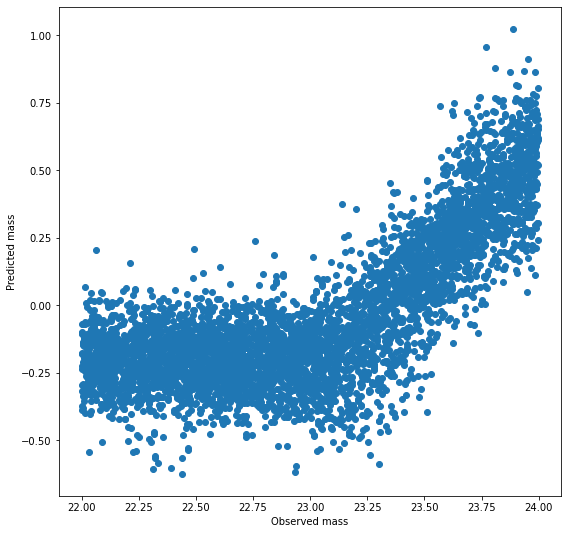

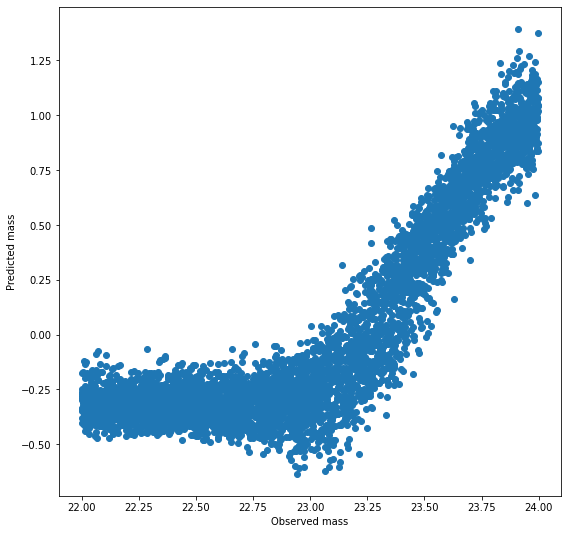

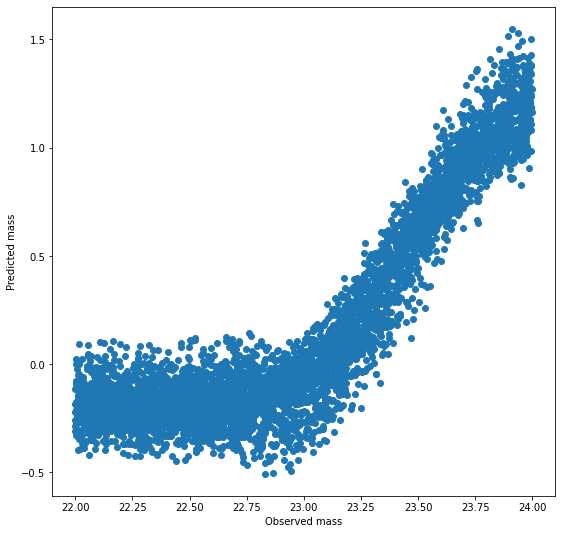

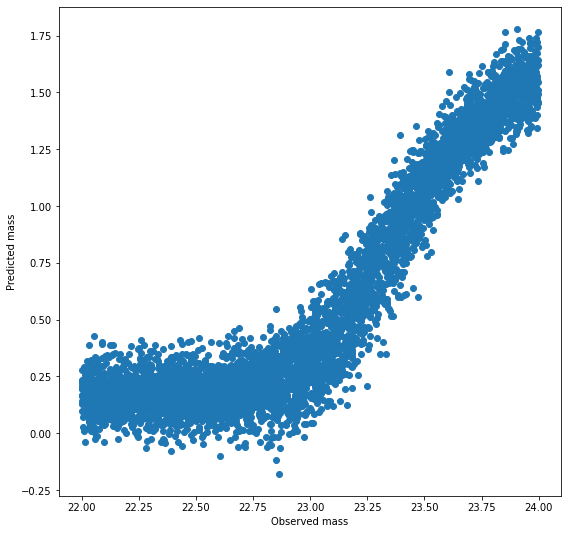

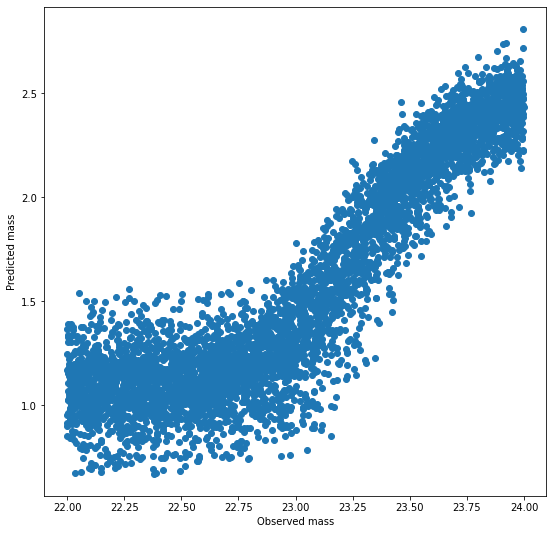

...

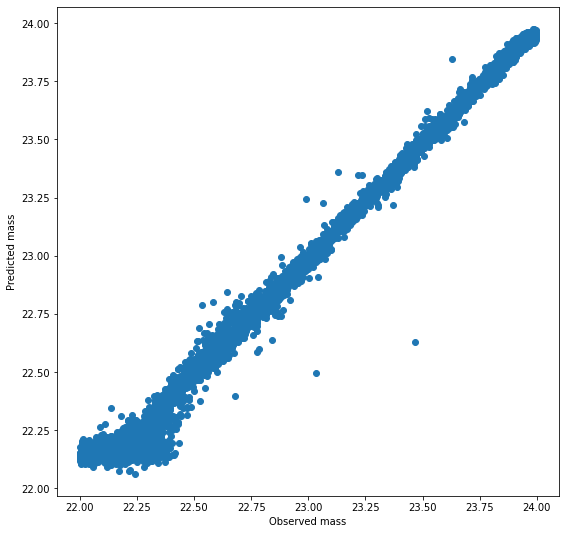

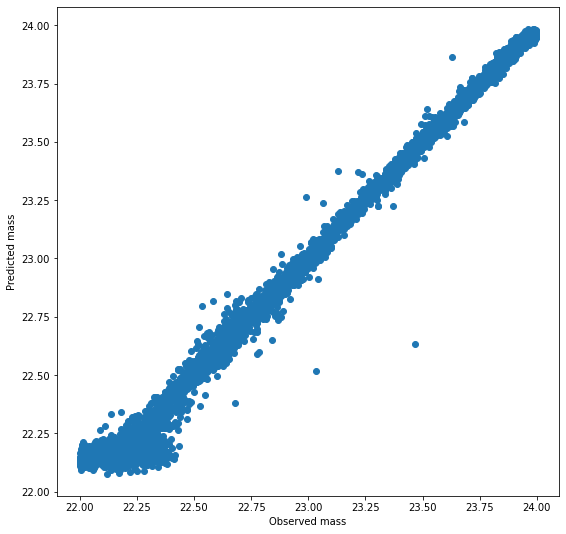

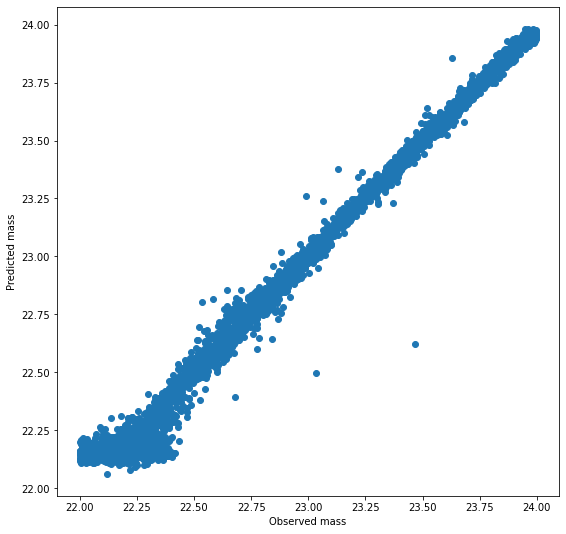

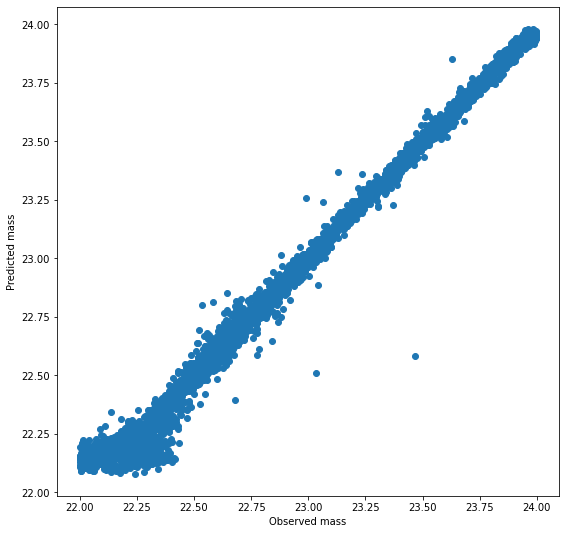

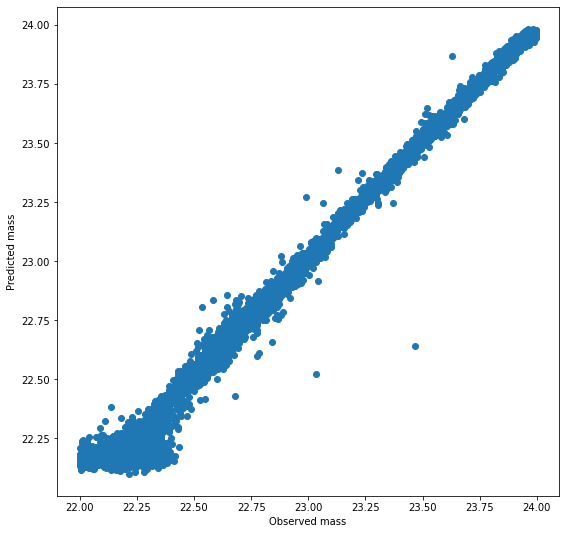

In [24]:
#training and tracking model
PATH = "basic_conv.pth"
model, loss_dict = fit_model(model, config, checkpoint_path = PATH)

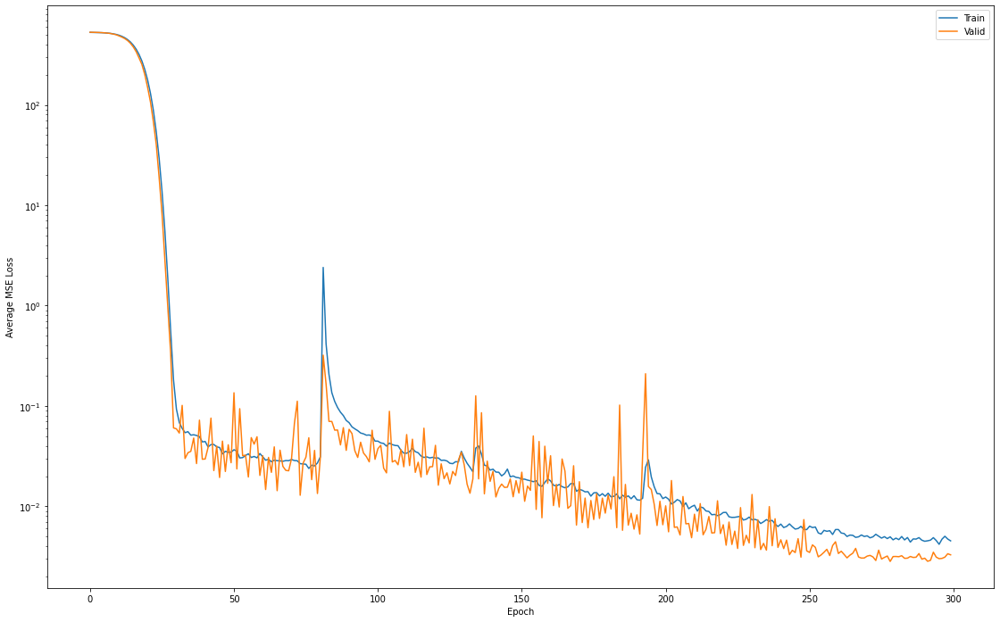

In [25]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_loss'], label='Train')
plt.semilogy(loss_dict['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average MSE Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val MSE loss history")]})

plt.show()

In [26]:
del model
gc.collect()

model = Regressor().to(device)
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [27]:
criterion = nn.MSELoss()

_, _, train_mse = test_epoch(model, train_loader, criterion)
print("Train set MSE:" + str(train_mse))

_, _, val_mse = test_epoch(model, val_loader, criterion)
print("Val set MSE:" + str(val_mse))

_, _, test_mse = test_epoch(model, test_loader, criterion)
print("Test set MSE:" + str(test_mse))

  0%|          | 0/105 [00:00<?, ?it/s]

Train set MSE:0.0022457098


  0%|          | 0/12 [00:00<?, ?it/s]

Val set MSE:0.0028245049


  0%|          | 0/20 [00:00<?, ?it/s]

Test set MSE:0.0027412935


In [28]:
scores = [[train_mse, val_mse, test_mse]]

wandb.log({"MSE_Scores": wandb.Table(data = scores, columns=["Train_MSE", "Val_MSE", "Test_MSE"])})

  0%|          | 0/20 [00:00<?, ?it/s]

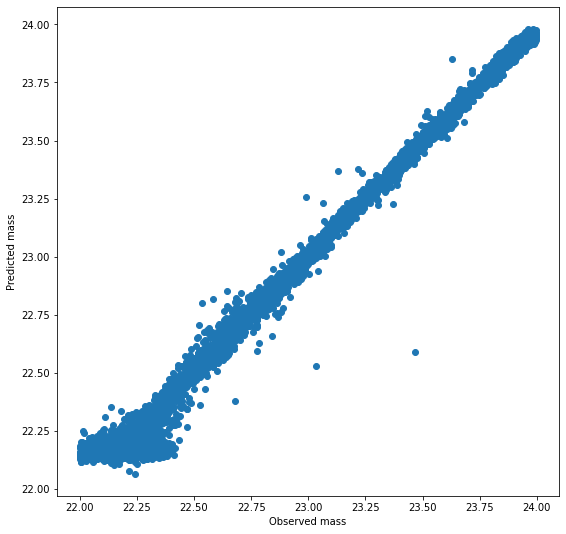

In [29]:
y_pred_list, y_truth_list, test_loss = test_epoch(model, test_loader, criterion)
    
def flatten_list(x):
    flattened_list = []
    for i in x:
        for j in i:
            flattened_list.append(j)

    return flattened_list

y_pred_list_flattened = flatten_list(y_pred_list)
y_truth_list_flattened = flatten_list(y_truth_list)

plt.figure(figsize=(9,9))
plt.scatter(y_truth_list_flattened, y_pred_list_flattened)
plt.xlabel('Observed mass')
plt.ylabel('Predicted mass')

plot_name = f"test_plot"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)

wandb.log({plot_name: [wandb.Image(pic, caption = f"Test Set predictions")]})
plt.show()

In [30]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,██▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▆▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,300
train_loss,0.00453
val_loss,0.00329
